In [3]:
import pandas as pd
import scanpy as sc
import pickle as pkl

import matplotlib.pyplot as plt
import seaborn as sb

/Users/karin.hrovatin/miniconda3/envs/scvi/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_csv from `anndata` is deprecated. Import anndata.io.read_csv instead.
  warnings.warn(msg, FutureWarning)
/Users/karin.hrovatin/miniconda3/envs/scvi/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_excel from `anndata` is deprecated. Import anndata.io.read_excel instead.
  warnings.warn(msg, FutureWarning)
/Users/karin.hrovatin/miniconda3/envs/scvi/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_hdf from `anndata` is deprecated. Import anndata.io.read_hdf instead.
  warnings.warn(msg, FutureWarning)
/Users/karin.hrovatin/miniconda3/envs/scvi/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_loom from `anndata` is deprecated. Import anndata.io.read_loom instead.
  warnings.warn(msg, FutureWarning)
/Users/karin.hrovatin/miniconda3/envs/scvi/lib/python3.10/site-packages/an

In [15]:
path='/Users/karin.hrovatin/Documents/TUM_PhD_diabetes/data/cross_system_integration/data/pancreas/vamp_cyc_pancreas/'
path_genes='/Users/karin.hrovatin/Documents/TUM_PhD_diabetes/data/cross_system_integration/data/gene_info/'

In [5]:
adata=sc.read_h5ad(path+'embed_full.h5ad')

In [6]:
adata=adata[adata.obs['cell_type_eval']=='beta',:].copy()

In [5]:
sc.pp.neighbors(adata,use_rep='X')
sc.tl.umap(adata)

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [6]:
adata

AnnData object with n_obs × n_vars = 139283 × 15
    obs: 'batch', 'mm_study', 'mm_sex', 'mm_age', 'mm_study_sample_design', 'mm_hc_gene_programs_parsed', 'mm_leiden_r1.5_parsed', 'cell_type_eval', 'system', 'hs_Sex', 'hs_Diabetes Status', 'leiden_system'
    uns: 'neighbors', 'umap'
    obsm: 'X_umap'
    obsp: 'distances', 'connectivities'

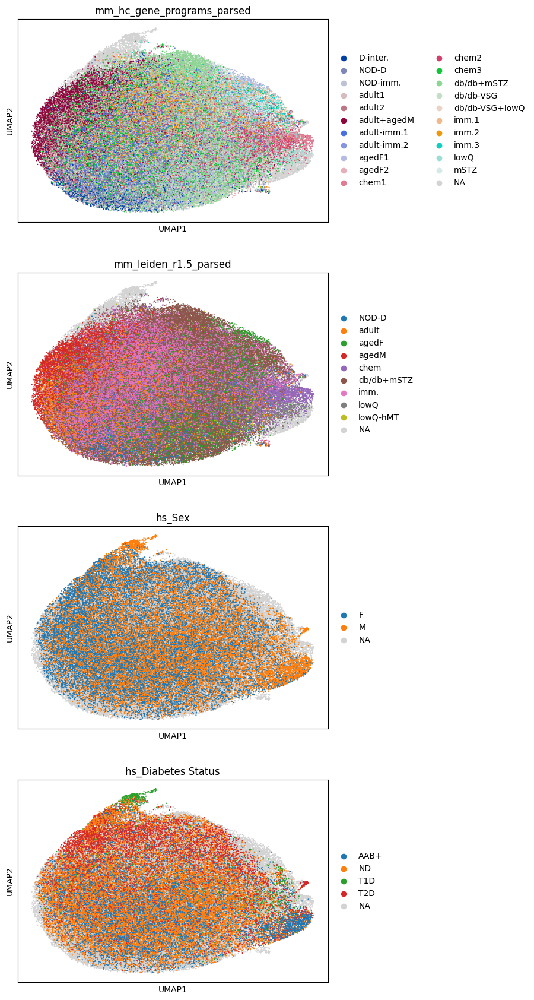

In [7]:
sc.pl.umap(adata,color=[
    'mm_hc_gene_programs_parsed', 
    'mm_leiden_r1.5_parsed', 
    'hs_Sex', 'hs_Diabetes Status',],
     s=10,ncols=1)

Subset to only healthy and T2D datat - for mouse only studies with T2D data, for human skip T1D and AAB.

In [5]:
adata_sub=adata[
    adata.obs.mm_study.isin(['STZ', 'VSG'])|adata.obs['hs_Diabetes Status'].isin(['ND', 'T2D'])
, :].copy()
sc.pp.neighbors(adata_sub,use_rep='X')
sc.tl.umap(adata_sub)

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


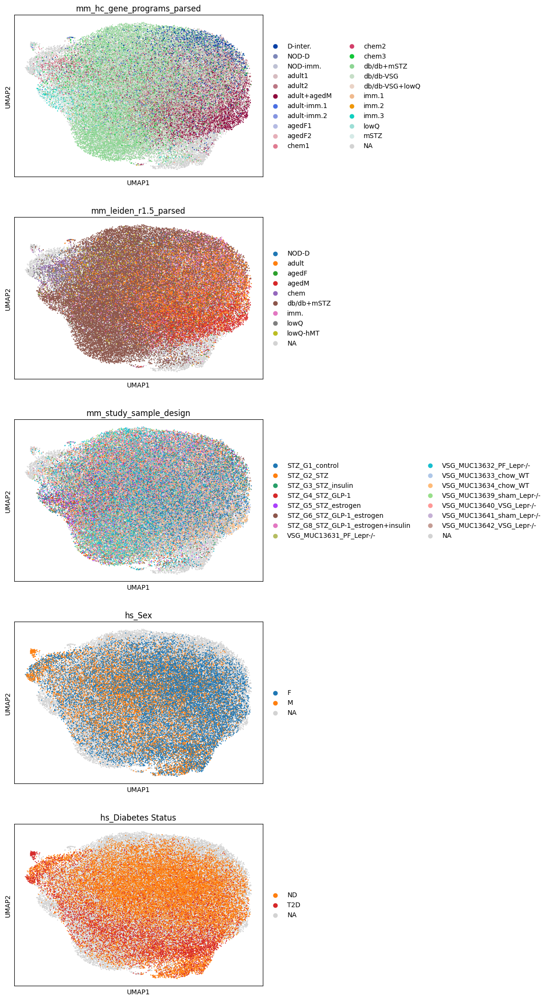

In [16]:
sc.pl.umap(adata_sub,color=[
    'mm_hc_gene_programs_parsed', 
    'mm_leiden_r1.5_parsed', 
     'mm_study_sample_design',
    'hs_Sex', 'hs_Diabetes Status',],
     s=10,ncols=1)

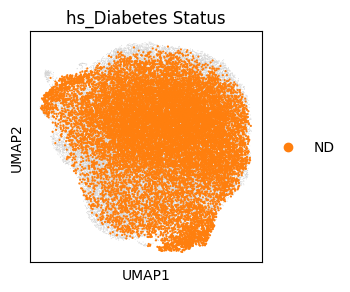

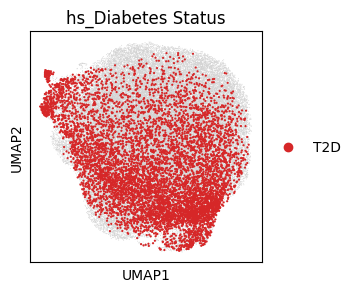

In [32]:
for cl in adata_sub.obs['hs_Diabetes Status'].dropna().unique():
    fig,ax=plt.subplots(figsize=(3,3))
    sc.pl.umap(adata_sub,ax=ax,show=False)
    sc.pl.umap(adata_sub[adata_sub.obs['hs_Diabetes Status']==cl,:], 
               color=['hs_Diabetes Status'], ax=ax,s=10)

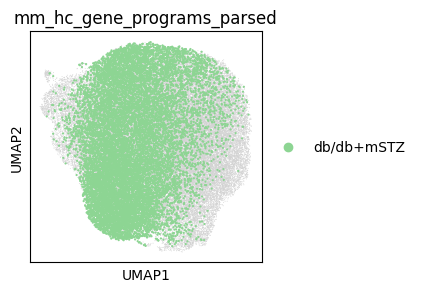

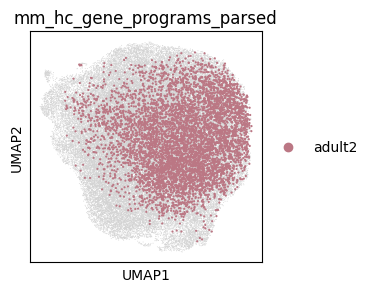

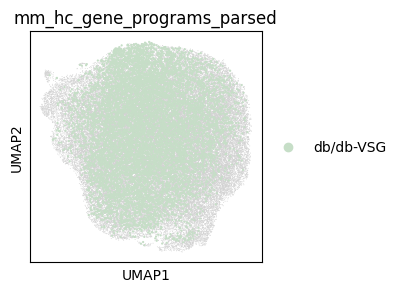

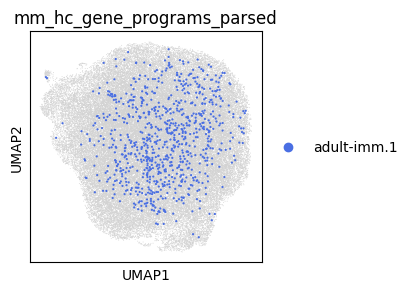

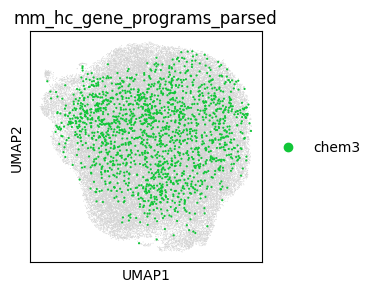

...

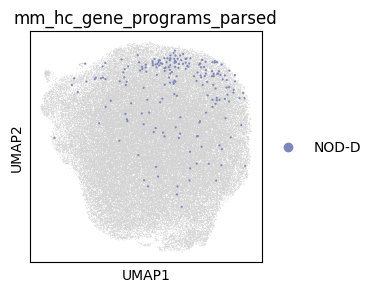

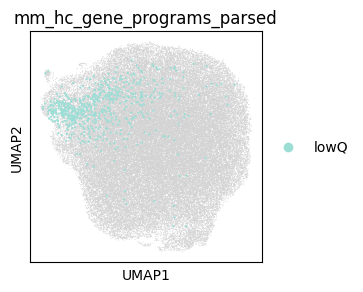

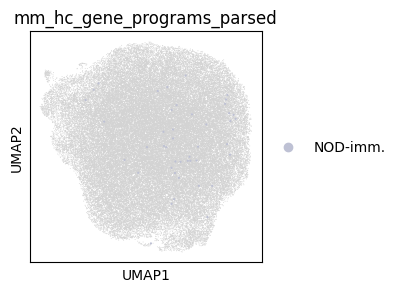

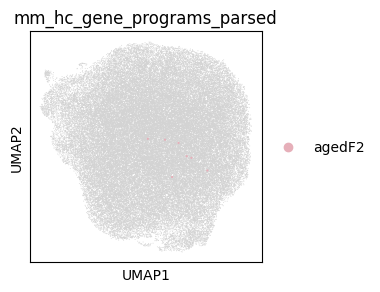

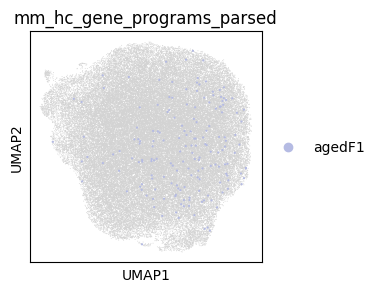

In [29]:
for cl in adata_sub.obs.mm_hc_gene_programs_parsed.dropna().unique():
    fig,ax=plt.subplots(figsize=(3,3))
    sc.pl.umap(adata_sub,ax=ax,show=False)
    sc.pl.umap(adata_sub[adata_sub.obs.mm_hc_gene_programs_parsed==cl,:], 
               color=['mm_hc_gene_programs_parsed'], ax=ax,s=10)

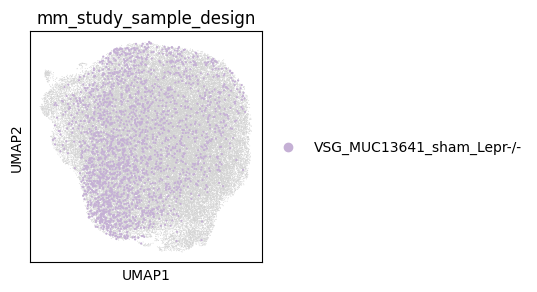

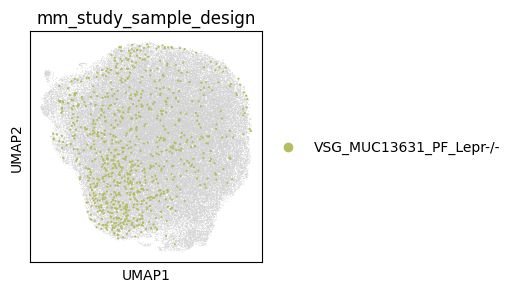

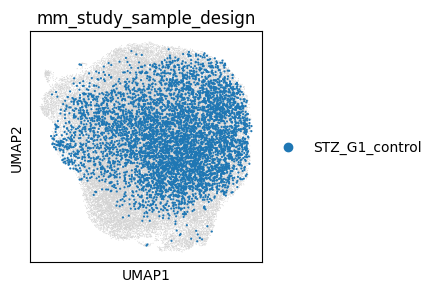

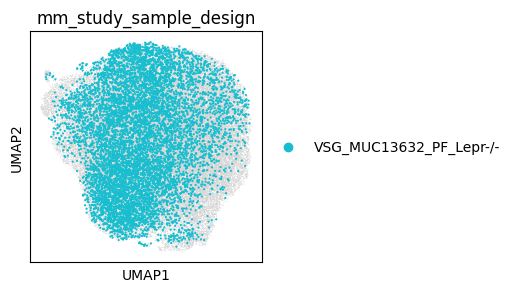

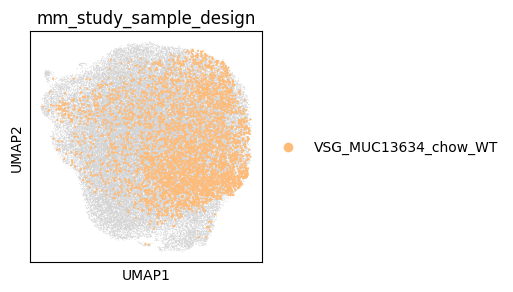

...

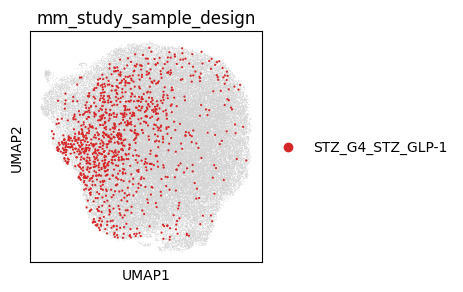

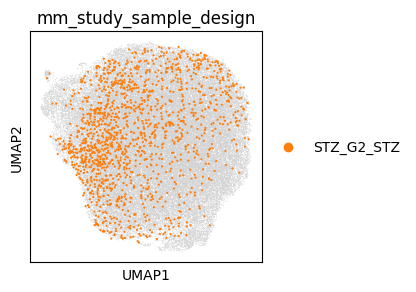

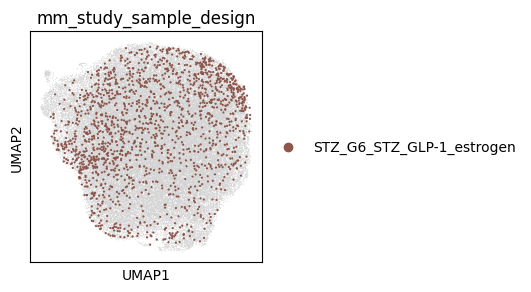

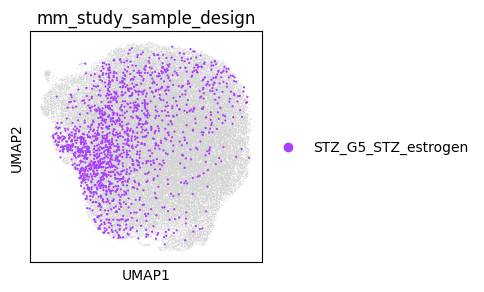

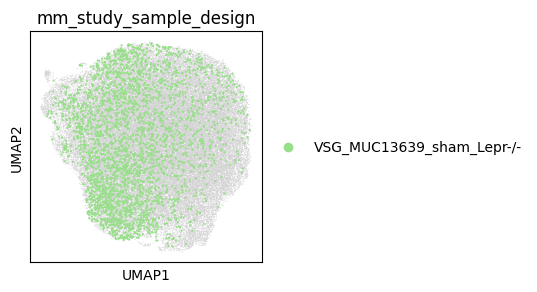

In [26]:
for sample in adata_sub.obs.mm_study_sample_design.dropna().unique():
    fig,ax=plt.subplots(figsize=(3,3))
    sc.pl.umap(adata_sub,ax=ax,show=False)
    sc.pl.umap(adata_sub[adata_sub.obs.mm_study_sample_design==sample,:], 
               color=['mm_study_sample_design'], ax=ax,s=10)

TODO exclude treatments

Comparison between cluster of cells that:
- T2D in mm and hs VS T2D in hs but not mm
- T2D in hs but not mm VS healthy in mm and hs 

In [31]:
sorted(adata_sub.obs.mm_study_sample_design.dropna().unique())

['STZ_G1_control',
 'STZ_G2_STZ',
 'STZ_G3_STZ_insulin',
 'STZ_G4_STZ_GLP-1',
 'STZ_G5_STZ_estrogen',
 'STZ_G6_STZ_GLP-1_estrogen',
 'STZ_G8_STZ_GLP-1_estrogen+insulin',
 'VSG_MUC13631_PF_Lepr-/-',
 'VSG_MUC13632_PF_Lepr-/-',
 'VSG_MUC13633_chow_WT',
 'VSG_MUC13634_chow_WT',
 'VSG_MUC13639_sham_Lepr-/-',
 'VSG_MUC13640_VSG_Lepr-/-',
 'VSG_MUC13641_sham_Lepr-/-',
 'VSG_MUC13642_VSG_Lepr-/-']

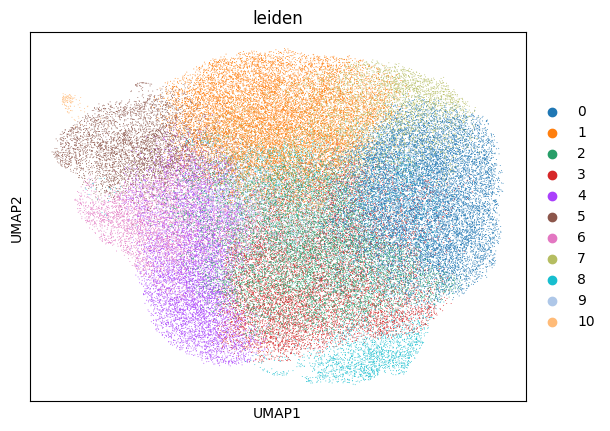

In [38]:
sc.tl.leiden(adata_sub,resolution=0.5)
sc.pl.umap(adata_sub,color='leiden')

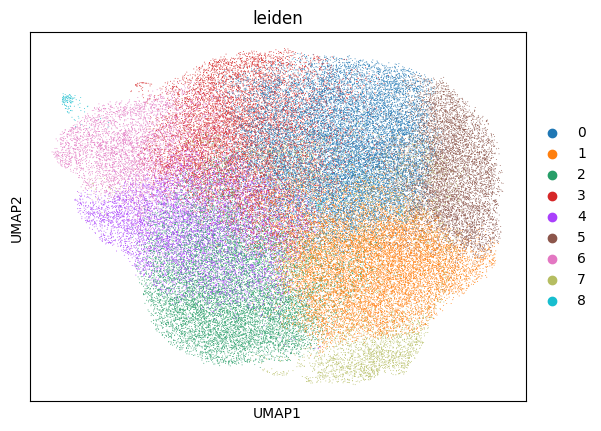

In [39]:
sc.tl.leiden(adata_sub,resolution=0.4)
sc.pl.umap(adata_sub,color='leiden')

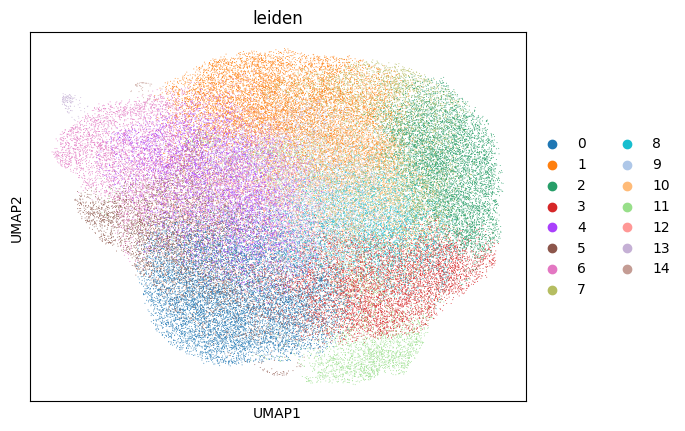

In [40]:
sc.tl.leiden(adata_sub,resolution=0.6)
sc.pl.umap(adata_sub,color='leiden')

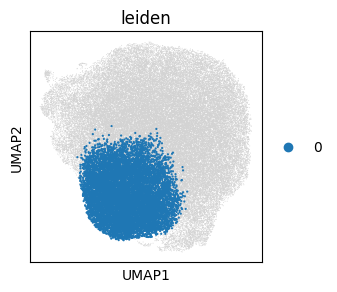

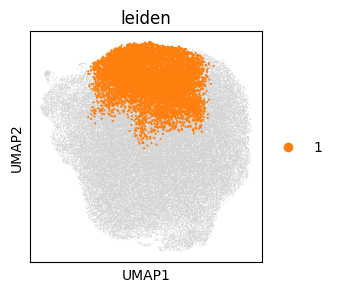

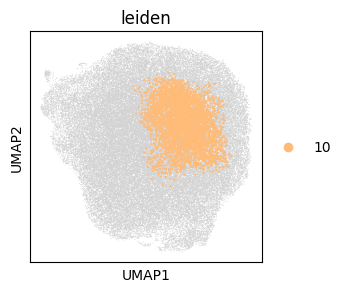

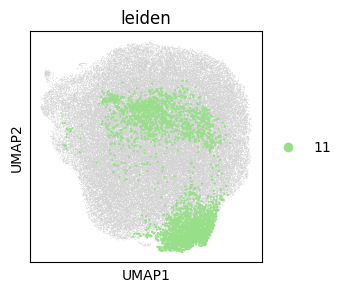

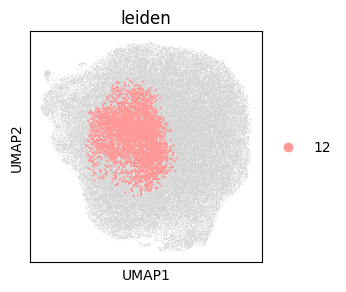

...

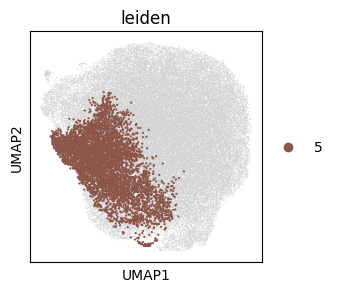

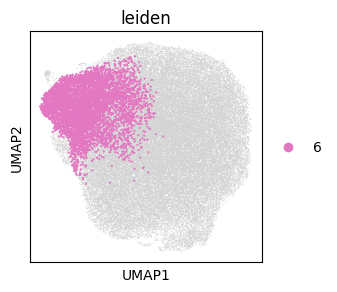

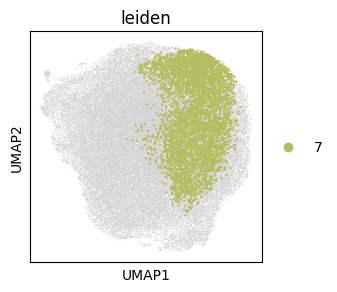

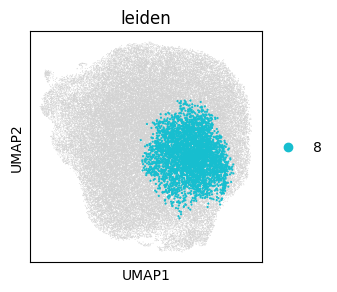

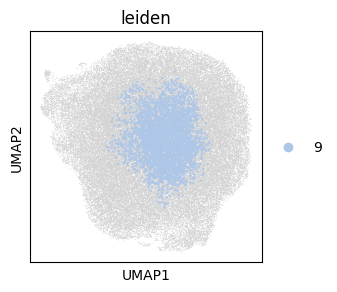

In [50]:
for cl in sorted(adata_sub.obs.leiden.dropna().unique()):
    fig,ax=plt.subplots(figsize=(3,3))
    sc.pl.umap(adata_sub,ax=ax,show=False)
    sc.pl.umap(adata_sub[adata_sub.obs.leiden==cl,:], 
               color=['leiden'], ax=ax,s=10)

In [51]:
pd.crosstab(adata_sub.obs.mm_study_sample_design,adata_sub.obs.leiden)

leiden,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
mm_study_sample_design,,,,,,,,,,,,,,,
STZ_G1_control,121,228,1052,871,307,354,384,294,473,446,493,116,559,95,2
STZ_G2_STZ,201,276,71,23,96,351,67,136,28,62,10,103,25,46,1
STZ_G3_STZ_insulin,6,106,240,122,50,200,61,132,65,79,58,41,32,10,2
STZ_G4_STZ_GLP-1,140,153,20,5,74,395,73,57,15,58,9,89,19,28,0
STZ_G5_STZ_estrogen,194,225,54,9,75,590,71,101,15,122,12,82,25,31,2
STZ_G6_STZ_GLP-1_estrogen,143,258,249,72,98,307,77,155,68,57,25,103,34,24,0
STZ_G8_STZ_GLP-1_estrogen+insulin,10,317,166,60,70,169,54,238,58,72,76,55,48,21,7
VSG_MUC13631_PF_Lepr-/-,341,112,30,16,109,67,38,66,8,32,5,4,11,26,0
VSG_MUC13632_PF_Lepr-/-,2436,1550,312,126,657,310,440,662,138,459,84,386,120,435,15


<Axes: xlabel='leiden', ylabel='mm_study_sample_design'>

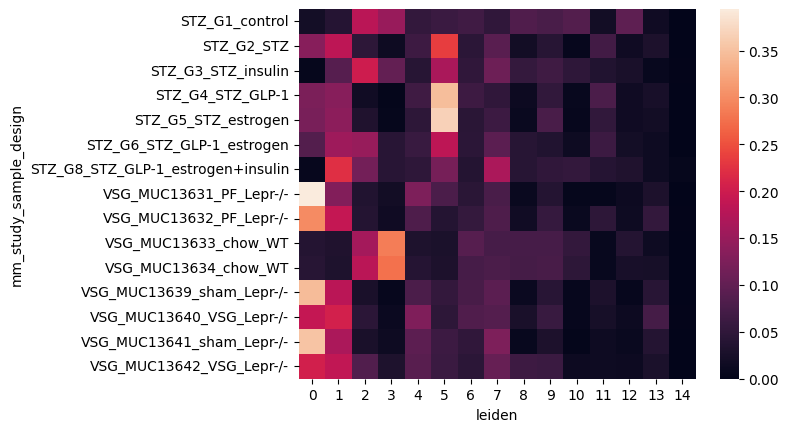

In [44]:
sb.heatmap(pd.crosstab(adata_sub.obs.mm_study_sample_design,adata_sub.obs.leiden,normalize='index'))

<Axes: xlabel='leiden', ylabel='mm_study_sample_design'>

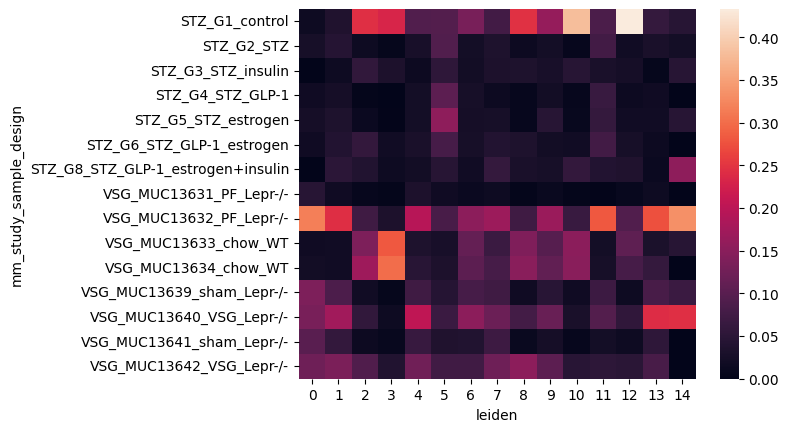

In [47]:
sb.heatmap(pd.crosstab(adata_sub.obs.mm_study_sample_design,adata_sub.obs.leiden,normalize='columns'))

In [55]:
pd.crosstab(adata_sub[adata_sub.obs['hs_Diabetes Status'].isin(['ND','T2D']),:].obs.batch,
            adata_sub[adata_sub.obs['hs_Diabetes Status'].isin(['ND','T2D']),:].obs['hs_Diabetes Status'])

hs_Diabetes Status,ND,T2D
batch,,
HPAP-022,590,0
HPAP-026,92,0
HPAP-034,29,0
HPAP-035,417,0
HPAP-036,311,0
HPAP-037,385,0
HPAP-039,98,0
HPAP-040,241,0
HPAP-042,106,0


In [54]:
pd.crosstab(adata_sub[adata_sub.obs['hs_Diabetes Status'].isin(['ND','T2D']),:].obs.batch,
            adata_sub[adata_sub.obs['hs_Diabetes Status'].isin(['ND','T2D']),:].obs.leiden)

leiden,0,1,2,3,4,5,6,7,8,9,10,11,12,13
batch,,,,,,,,,,,,,,
HPAP-022,75,1,5,155,60,35,91,7,4,11,38,41,65,2
HPAP-026,0,7,16,15,3,0,8,0,10,0,16,11,6,0
HPAP-034,0,1,3,0,0,0,0,2,0,0,0,3,0,20
HPAP-035,8,18,39,47,22,13,25,5,34,13,82,31,73,7
HPAP-036,10,9,16,31,41,8,6,4,30,5,28,75,33,15
HPAP-037,43,20,26,10,113,9,5,25,27,14,11,11,33,38
HPAP-039,2,7,1,1,9,2,21,9,0,2,18,2,9,15
HPAP-040,17,31,27,1,22,6,12,25,23,24,16,24,5,8
HPAP-042,0,44,0,0,5,22,17,1,0,2,0,11,4,0


<Axes: xlabel='leiden', ylabel='hs_Diabetes Status'>

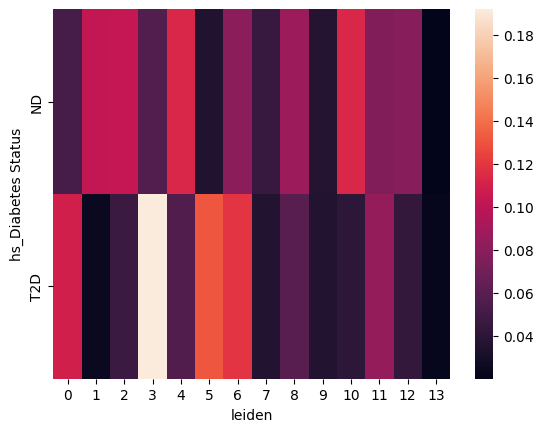

In [46]:
sb.heatmap(pd.crosstab(adata_sub.obs['hs_Diabetes Status'],adata_sub.obs.leiden,normalize='index'))

<Axes: xlabel='leiden', ylabel='hs_Diabetes Status'>

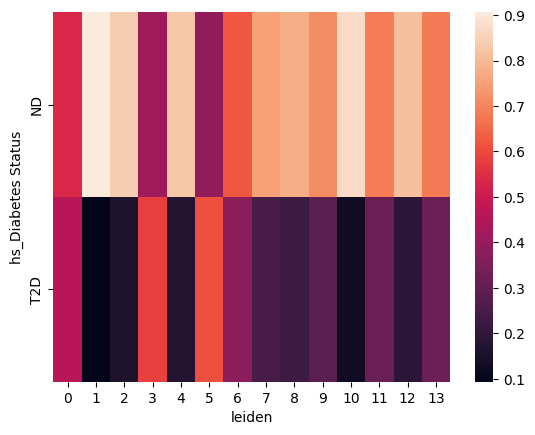

In [48]:
sb.heatmap(pd.crosstab(adata_sub.obs['hs_Diabetes Status'],adata_sub.obs.leiden,normalize='columns'))

In [62]:
pkl.dump(adata_sub.obs.leiden.to_dict(),open(path+'leiden_T2D-ND.pkl','wb'))

## Cluster gene set analysis

### On data used for integration

In [71]:
# Beta cell expression
adata_expr = sc.read_h5ad(path+'beta_cells_sysvi_filtered.h5ad')

In [72]:
leiden=pkl.load(open(path+'leiden_T2D-ND.pkl','rb'))

In [73]:
adata_expr.obs['leiden']=pd.Series(leiden)
adata_expr.obs['species']=adata_expr.obs['mm_study'].isna().map({True:'hs',False:'mm'})

In [74]:
adata_expr_mm=adata_expr[adata_expr.obs.species=='mm',:].copy()
adata_expr_hs=adata_expr[adata_expr.obs.species=='hs',:].copy()

In [75]:
gene_maps=pd.read_table(path_genes+'genes_hs_mm_20250214.txt')
# gene_map_hs=gene_maps.dropna(subset=['Gene stable ID','Gene name'])
# gene_map_hs=dict(zip(gene_map_hs['Gene name'],gene_map_hs['Gene stable ID']))
gene_map_mm=gene_maps.dropna(subset=['Mouse gene stable ID','Gene name'])
gene_map_mm=dict(zip(gene_map_mm['Gene name'],gene_map_mm['Mouse gene stable ID']))

In [76]:
gene_sets={}
for l in open(path_genes+'c5.go.v2024.1.Hs.symbols.gmt').readlines():
    l=l.rstrip('\n').split('\t')
    gene_sets[l[0]]=l[2:]
# gene_sets_hs={name:[gene_map_hs.get(g) for g in genes if g in gene_map_hs] for name,genes in gene_sets.items()}
gene_sets={name:[gene_map_mm.get(g) for g in genes if g in gene_map_mm] for name,genes in gene_sets.items()}

In curr data all genes were mapped to mouse EIDs so use mouse GS

In [77]:
gene_set_names=[
    # From MIA paper

    # T1D
    #'GOCC_MHC_CLASS_I_PROTEIN_COMPLEX',
    #'GOBP_ANTIMICROBIAL_HUMORAL_RESPONSE',
    # T2D
    'GOBP_REGULATION_OF_RESPONSE_TO_EXTRACELLULAR_STIMULUS',
    'GOCC_TRANSPORT_VESICLE_MEMBRANE',
    'GOBP_ENDOCRINE_PANCREAS_DEVELOPMENT',
    'GOBP_HORMONE_METABOLIC_PROCESS',
    'GOBP_OXIDATIVE_PHOSPHORYLATION',
    'GOBP_RIBOSOME_BIOGENESIS',
    'GOBP_REGULATION_OF_CELLULAR_RESPONSE_TO_HYPOXIA',
    'GOBP_PROTEASOMAL_PROTEIN_CATABOLIC_PROCESS',


]
# Missing GS
print(set(gene_set_names)-set(gene_sets.keys()))
gene_set_names=[g for g in gene_set_names if g in gene_sets]

{'GOBP_REGULATION_OF_RESPONSE_TO_EXTRACELLULAR_STIMULUS'}


In [78]:
# Compute scores
# First remove pre-computed scores
for system,adata_temp in [('mm',adata_expr_mm), ('hs',adata_expr_hs)]:
    print(system)
    adata_temp.obs.drop([c for c in adata_temp.obs.columns 
                             if 'score_gs_' in c],axis=1,inplace=True)
    all_genes=set(adata_temp.var_names)
    for gs in gene_set_names:
        genes=[g for g in gene_sets[gs] if g in all_genes]
        print(gs,len(genes))
        if len(genes)>=5:
            sc.tl.score_genes(adata_temp,
                              genes,
                              score_name='score_gs_'+gs )

mm
GOCC_TRANSPORT_VESICLE_MEMBRANE 14
GOBP_ENDOCRINE_PANCREAS_DEVELOPMENT 12
GOBP_HORMONE_METABOLIC_PROCESS 44
GOBP_OXIDATIVE_PHOSPHORYLATION 5
GOBP_RIBOSOME_BIOGENESIS 1
GOBP_REGULATION_OF_CELLULAR_RESPONSE_TO_HYPOXIA 2
GOBP_PROTEASOMAL_PROTEIN_CATABOLIC_PROCESS 39
hs
GOCC_TRANSPORT_VESICLE_MEMBRANE 14
GOBP_ENDOCRINE_PANCREAS_DEVELOPMENT 12
GOBP_HORMONE_METABOLIC_PROCESS 44
GOBP_OXIDATIVE_PHOSPHORYLATION 5
GOBP_RIBOSOME_BIOGENESIS 1
GOBP_REGULATION_OF_CELLULAR_RESPONSE_TO_HYPOXIA 2
GOBP_PROTEASOMAL_PROTEIN_CATABOLIC_PROCESS 39


In [84]:
[l for l in adata_temp.obs.leiden.unique() if l not in ['0','3','10','2']]

['5', '9', '4', '12', '1', '8', '7', nan, '13', '6', '11', '14']

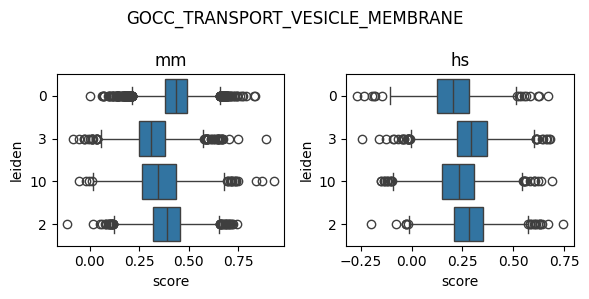

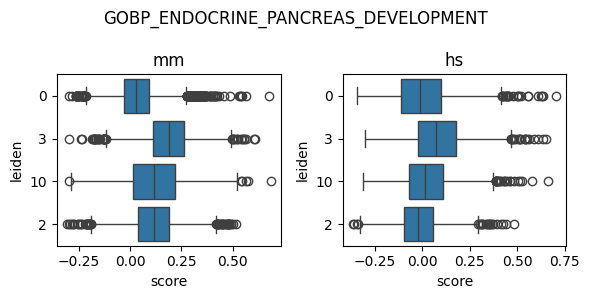

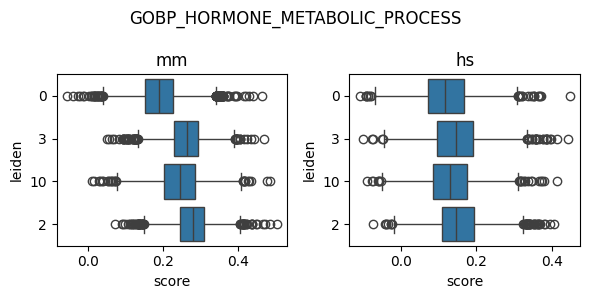

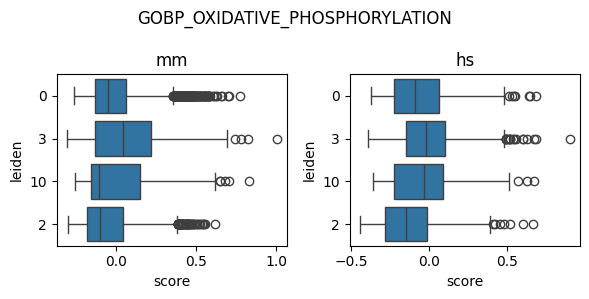

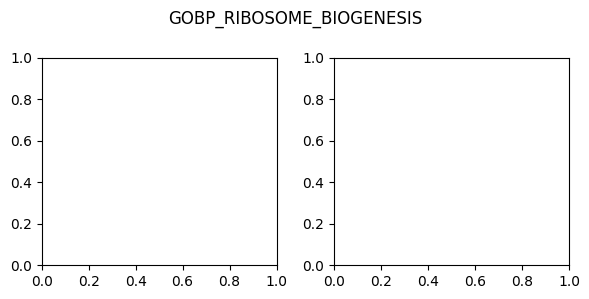

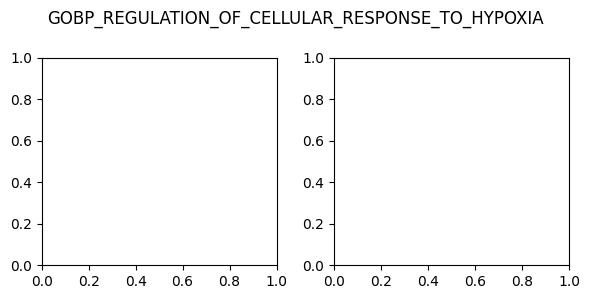

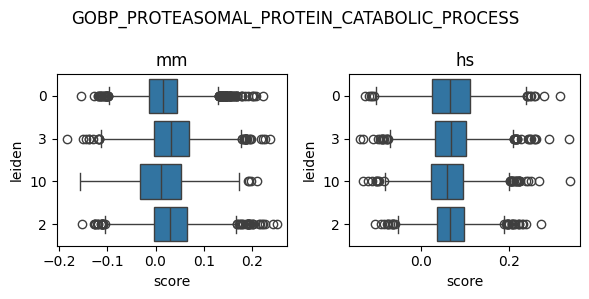

In [90]:
for gs in gene_set_names:
    fig,axs=plt.subplots(1,2,figsize=(6,3))
    for i,(system,adata_temp) in enumerate([('mm',adata_expr_mm), ('hs',adata_expr_hs)]):
        gs_col='score_gs_'+gs
        if gs_col in adata_temp.obs.columns:
            ax=axs[i]
            adata_temp=adata_temp[adata_temp.obs.leiden.isin(['0','3','10','2'])].copy()
            adata_temp.obs.leiden=pd.Categorical(
                values=adata_temp.obs.leiden,
                categories=['0','3','10','2'],#+sorted([l for l in adata_temp.obs.leiden.dropna().unique() if l not in ['0','3','10','2']]),
                ordered=True)
            g=sb.boxplot(y='leiden',x=gs_col,data=adata_temp.obs,ax=ax)
            ax.set_xlabel('score')
            ax.set_title(system)
    fig.suptitle(gs)
    fig.tight_layout()
    plt.show()
    plt.close()

### On all genes

In [59]:
# Beta cell expression
adata_expr = sc.read_h5ad(path+'beta_cells_concat_filtered_all_ortho_genes.h5ad')

In [60]:
leiden=pkl.load(open(path+'leiden_T2D-ND.pkl','rb'))

In [61]:
adata_expr.obs['leiden']=pd.Series(leiden)
adata_expr.obs['species']=adata_expr.obs['mm_study'].isna().map({True:'hs',False:'mm'})

In [62]:
adata_expr_mm=adata_expr[adata_expr.obs.species=='mm',:].copy()
adata_expr_hs=adata_expr[adata_expr.obs.species=='hs',:].copy()

In [63]:
#Normalize data of each species
for a in [adata_expr_mm,adata_expr_hs]:
    sc.pp.normalize_total(a, target_sum=1e4)
    sc.pp.log1p(a)

In [64]:
# gene_maps=pd.read_table(path_genes+'genes_hs_mm_20250214.txt')
# gene_map_hs=gene_maps.dropna(subset=['Gene stable ID','Gene name'])
# gene_map_hs=dict(zip(gene_map_hs['Gene name'],gene_map_hs['Gene stable ID']))
# gene_map_mm=gene_maps.dropna(subset=['Mouse gene stable ID','Gene name'])
# gene_map_mm=dict(zip(gene_map_mm['Gene name'],gene_map_mm['Mouse gene stable ID']))

In [65]:
gene_sets={}
for l in open(path_genes+'c5.go.v2024.1.Hs.symbols.gmt').readlines():
    l=l.rstrip('\n').split('\t')
    gene_sets[l[0]]=l[2:]
# gene_sets_hs={name:[gene_map_hs.get(g) for g in genes if g in gene_map_hs] for name,genes in gene_sets.items()}
# gene_sets_mm={name:[gene_map_mm.get(g) for g in genes if g in gene_map_mm] for name,genes in gene_sets.items()}

In curr data all genes were mapped to mouse EIDs so use mouse GS

In [66]:
gene_set_names=[
    # From MIA paper
    # T1D
    #'GOCC_MHC_CLASS_I_PROTEIN_COMPLEX',
    #'GOBP_ANTIMICROBIAL_HUMORAL_RESPONSE',
    # T2D
    'GOBP_REGULATION_OF_RESPONSE_TO_EXTRACELLULAR_STIMULUS',
    'GOCC_TRANSPORT_VESICLE_MEMBRANE',
    'GOBP_ENDOCRINE_PANCREAS_DEVELOPMENT',
    'GOBP_HORMONE_METABOLIC_PROCESS',
    'GOBP_OXIDATIVE_PHOSPHORYLATION',
    'GOBP_RIBOSOME_BIOGENESIS',
    'GOBP_REGULATION_OF_CELLULAR_RESPONSE_TO_HYPOXIA',
    'GOBP_PROTEASOMAL_PROTEIN_CATABOLIC_PROCESS',


]
# Missing GS
print(set(gene_set_names)-set(gene_sets.keys()))
gene_set_names=[g for g in gene_set_names if g in gene_sets]

{'GOBP_REGULATION_OF_RESPONSE_TO_EXTRACELLULAR_STIMULUS'}


In [67]:
# Compute scores
# First remove pre-computed scores
for system,adata_temp in [('mm',adata_expr_mm), ('hs',adata_expr_hs)]:
    print(system)
    adata_temp.obs.drop([c for c in adata_temp.obs.columns 
                             if 'score_gs_' in c],axis=1,inplace=True)
    all_genes=set(adata_temp.var_names)
    for gs in gene_set_names:
        genes=[g for g in gene_sets[gs] if g in all_genes]
        print(gs,len(genes))
        if len(genes)>=5:
            sc.tl.score_genes(adata_temp,
                              genes,
                              score_name='score_gs_'+gs )

mm
GOCC_TRANSPORT_VESICLE_MEMBRANE 217
GOBP_ENDOCRINE_PANCREAS_DEVELOPMENT 41
GOBP_HORMONE_METABOLIC_PROCESS 205
GOBP_OXIDATIVE_PHOSPHORYLATION 133
GOBP_RIBOSOME_BIOGENESIS 288
GOBP_REGULATION_OF_CELLULAR_RESPONSE_TO_HYPOXIA 17
GOBP_PROTEASOMAL_PROTEIN_CATABOLIC_PROCESS 494
hs
GOCC_TRANSPORT_VESICLE_MEMBRANE 217
GOBP_ENDOCRINE_PANCREAS_DEVELOPMENT 41
GOBP_HORMONE_METABOLIC_PROCESS 205
GOBP_OXIDATIVE_PHOSPHORYLATION 133
GOBP_RIBOSOME_BIOGENESIS 288
GOBP_REGULATION_OF_CELLULAR_RESPONSE_TO_HYPOXIA 17
GOBP_PROTEASOMAL_PROTEIN_CATABOLIC_PROCESS 494


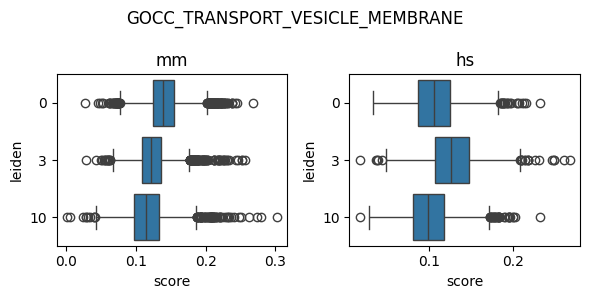

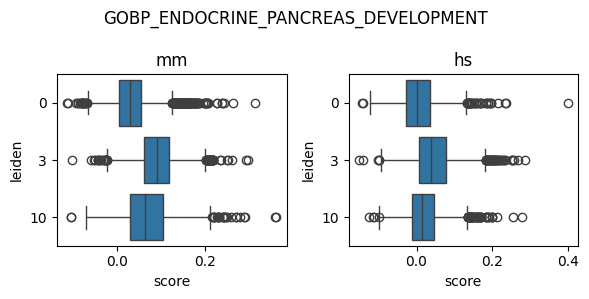

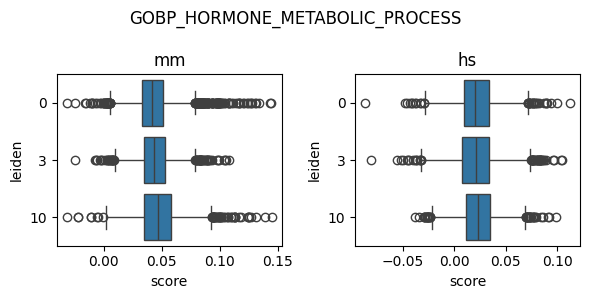

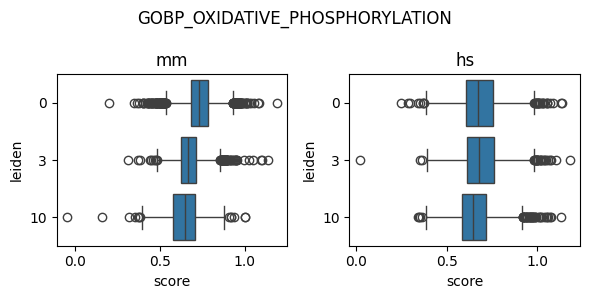

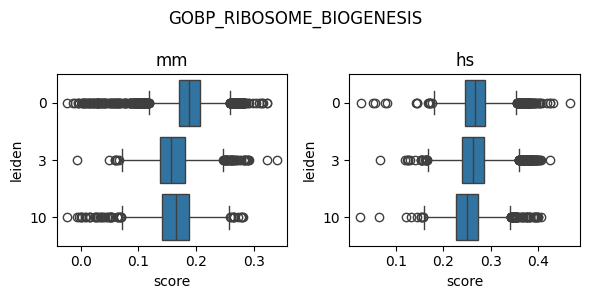

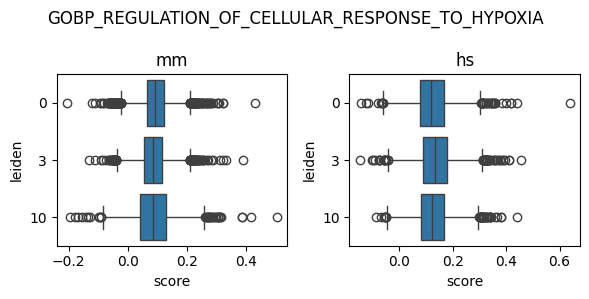

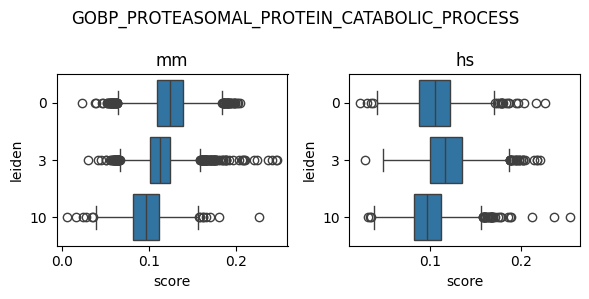

In [68]:
for gs in gene_set_names:
    fig,axs=plt.subplots(1,2,figsize=(6,3))
    for i,(system,adata_temp) in enumerate([('mm',adata_expr_mm), ('hs',adata_expr_hs)]):
        gs_col='score_gs_'+gs
        if gs_col in adata_temp.obs.columns:
            ax=axs[i]
            adata_temp=adata_temp[adata_temp.obs.leiden.isin(['0','3','10',])].copy()
            adata_temp.obs.leiden=pd.Categorical(values=adata_temp.obs.leiden,categories=['0','3','10'],ordered=True)
            g=sb.boxplot(y='leiden',x=gs_col,data=adata_temp.obs,ax=ax)
            ax.set_xlabel('score')
            ax.set_title(system)
    fig.suptitle(gs)
    fig.tight_layout()
    plt.show()
    plt.close()